<a href="https://colab.research.google.com/github/chaupmbn/Image_Retrieval/blob/master/image_retrieval_basic_method.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!gdown 1--dRxUzipN22f8c09GjTKPQFdJb1ZqYj

Downloading...
From (original): https://drive.google.com/uc?id=1--dRxUzipN22f8c09GjTKPQFdJb1ZqYj
From (redirected): https://drive.google.com/uc?id=1--dRxUzipN22f8c09GjTKPQFdJb1ZqYj&confirm=t&uuid=f3ba752d-9734-4b4e-97f9-e78c5242461b
To: /content/data.zip
100% 487M/487M [01:17<00:00, 6.31MB/s]


In [5]:
!unzip data

Archive:  data.zip
   creating: data/
   creating: data/train/
   creating: data/train/waterfall/
   creating: data/test/
   creating: data/test/waterfall/
  inflating: data/test/waterfall/9536683732_3c101945da_b.jpg  
   creating: data/train/Mushroom/
  inflating: data/train/Mushroom/4961199453_557599aa0b_b.jpg  
  inflating: data/train/Mushroom/481012156_f8751644b8_b.jpg  
  inflating: data/train/Mushroom/30773281961_a2983bf1be_b.jpg  
  inflating: data/train/Mushroom/29359074785_d9567082ce_b.jpg  
  inflating: data/train/Mushroom/3397647648_48b7c31722_b.jpg  
  inflating: data/train/Mushroom/21545048500_e15da413a7_b.jpg  
  inflating: data/train/Mushroom/189098954_f360f4bdfe_b.jpg  
  inflating: data/train/Mushroom/3607099094_eed0cd0fed_b.jpg  
  inflating: data/train/Mushroom/846207623_72126d2f02_b.jpg  
  inflating: data/train/Mushroom/52954574_058d5c59b3_b.jpg  
  inflating: data/train/Mushroom/6244561647_1eda34a95e_b.jpg  
  inflating: data/train/Mushroom/897666596_34a809f30c_b.

In [6]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

## Get Data

Tạo list các đường dẫn cho ảnh lấy embedding và được đưa vào database

dic_categories change to class_name

In [7]:
ROOT = 'data'
CLASS_NAME = sorted(list(os.listdir(f'{ROOT}/train')))

In [8]:
def read_image_from_path(path, size):
    im = Image.open(path).convert('RGB').resize(size)
    return np.array(im)

def folder_to_images(folder, size):
    list_dir = [folder + '/' + name for name in os.listdir(folder)]
    images_np = np.zeros(shape=(len(list_dir), *size, 3))
    images_path = []
    for i, path in enumerate(list_dir):
        images_np[i] = read_image_from_path(path, size)
        images_path.append(path)
    images_path = np.array(images_path)
    return images_np, images_path

In [9]:
def plot_results(querquery_pathy, ls_path_score, reverse):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(read_image_from_path(querquery_pathy, size=(448,448)))
    plt.title(f"Query Image: {querquery_pathy.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(sorted(ls_path_score, key=lambda x : x[1], reverse=reverse)[:5], 2):
        fig.add_subplot(2, 3, i)
        plt.imshow(read_image_from_path(path[0], size=(448,448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16)
        plt.axis("off")
    plt.show()

## Absolute Difference

In [10]:
def absolute_difference(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    return np.sum(np.abs(data - query), axis=axis_batch_size)

In [11]:
def get_l1_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            rates = absolute_difference(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

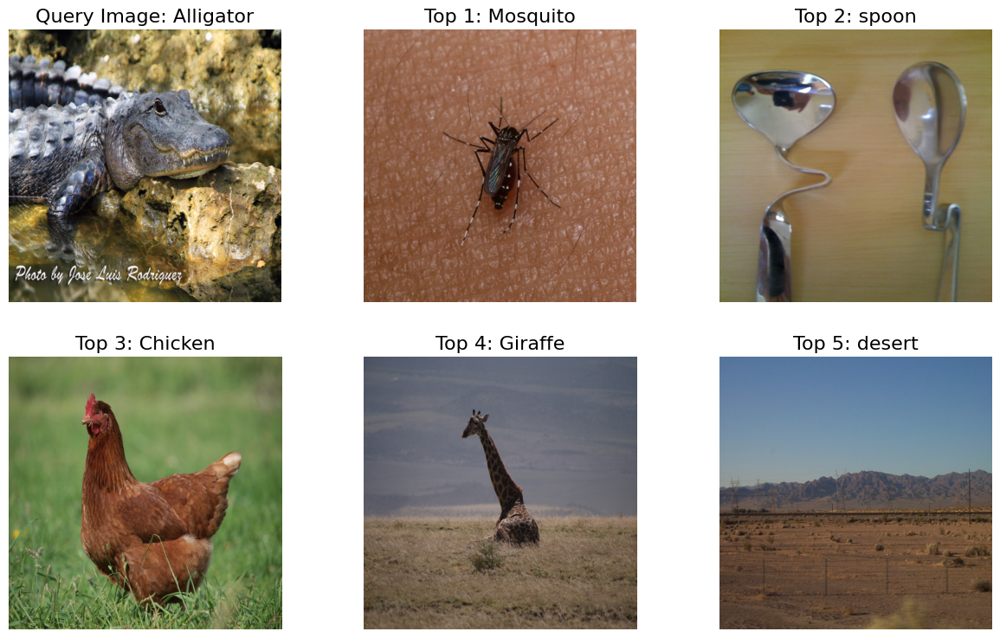

In [12]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Alligator/17250018551_eaf395294d_b.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [13]:
ls_path_score

[('data/train/Mushroom/4961199453_557599aa0b_b.jpg', 32993388.0),
 ('data/train/Mushroom/481012156_f8751644b8_b.jpg', 38128849.0),
 ('data/train/Mushroom/30773281961_a2983bf1be_b.jpg', 32995418.0),
 ('data/train/Mushroom/29359074785_d9567082ce_b.jpg', 47283006.0),
 ('data/train/Mushroom/3397647648_48b7c31722_b.jpg', 39966407.0),
 ('data/train/Mushroom/21545048500_e15da413a7_b.jpg', 39594607.0),
 ('data/train/Mushroom/189098954_f360f4bdfe_b.jpg', 43888161.0),
 ('data/train/Mushroom/3607099094_eed0cd0fed_b.jpg', 40988127.0),
 ('data/train/Mushroom/846207623_72126d2f02_b.jpg', 39007240.0),
 ('data/train/Mushroom/52954574_058d5c59b3_b.jpg', 36639039.0),
 ('data/train/Mushroom/6244561647_1eda34a95e_b.jpg', 42260369.0),
 ('data/train/Mushroom/897666596_34a809f30c_b.jpg', 35881297.0),
 ('data/train/Mushroom/5458607051_4daae473bf_b.jpg', 38953816.0),
 ('data/train/Mushroom/14882452851_009c72bfaf_b.jpg', 39189936.0),
 ('data/train/Mushroom/21570252409_e4633317c4_b.jpg', 40868604.0),
 ('data/tra

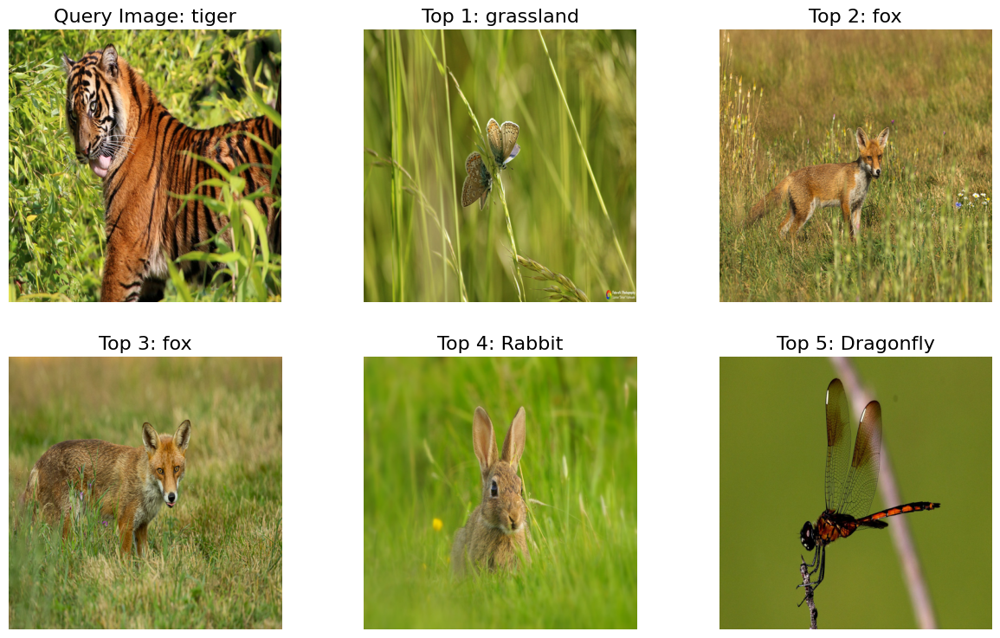

In [14]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/tiger/15912220596_0efe5578be_b.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

## Mean Square Difference

In [15]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    return np.mean((data - query)**2, axis=axis_batch_size)

In [16]:
def get_l2_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            rates = mean_square_difference(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

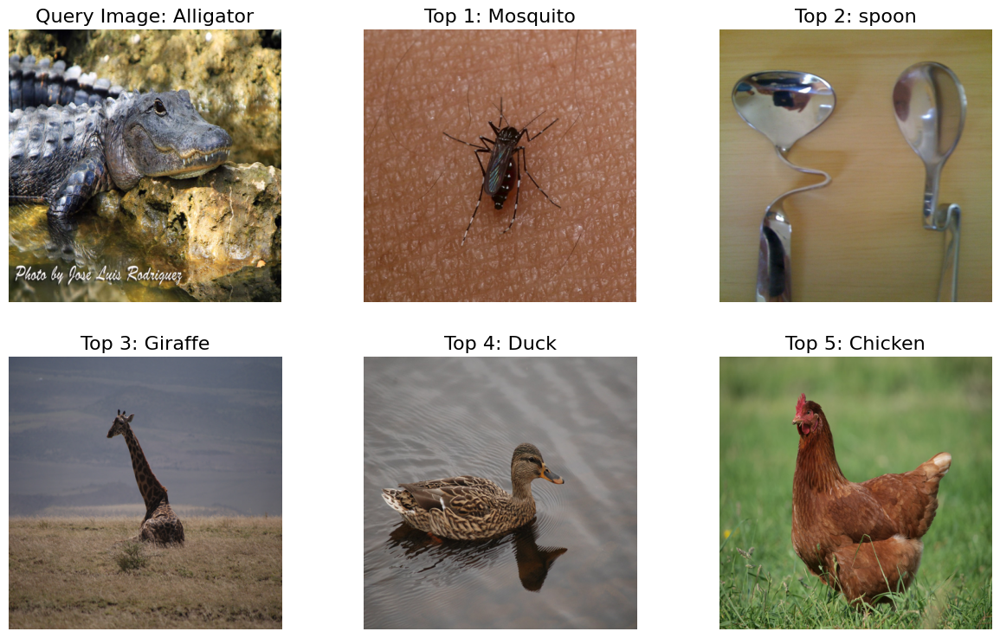

In [17]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Alligator/17250018551_eaf395294d_b.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

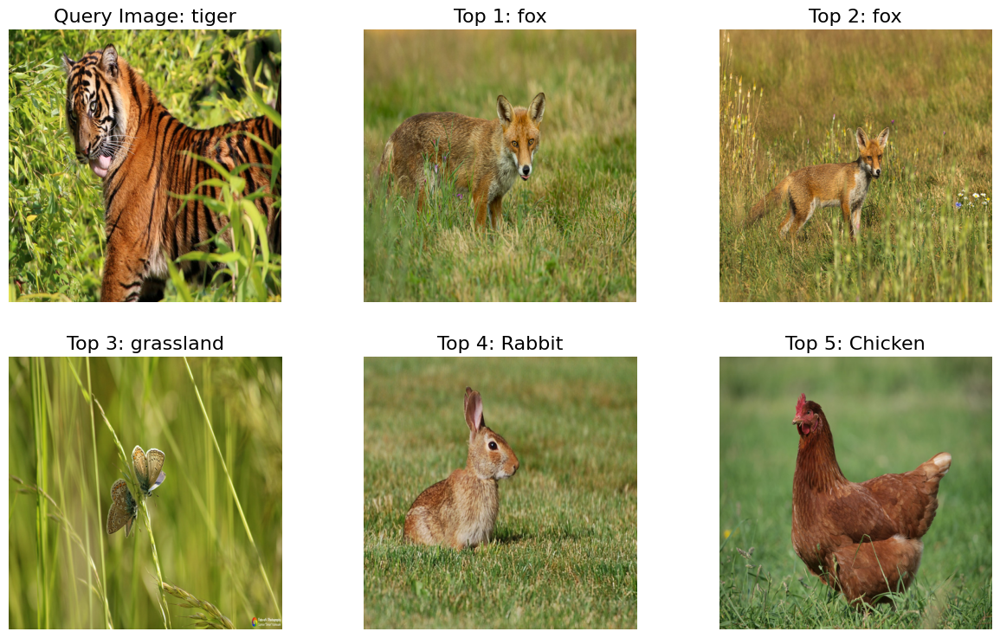

In [18]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/tiger/15912220596_0efe5578be_b.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [19]:
ls_path_score

[('data/train/Mushroom/4961199453_557599aa0b_b.jpg', 4164.023831114477),
 ('data/train/Mushroom/481012156_f8751644b8_b.jpg', 6435.8608996332905),
 ('data/train/Mushroom/30773281961_a2983bf1be_b.jpg', 4076.206783787734),
 ('data/train/Mushroom/29359074785_d9567082ce_b.jpg', 8570.275913783482),
 ('data/train/Mushroom/3397647648_48b7c31722_b.jpg', 8159.322647613733),
 ('data/train/Mushroom/21545048500_e15da413a7_b.jpg', 7174.9630035608),
 ('data/train/Mushroom/189098954_f360f4bdfe_b.jpg', 7542.8664766687925),
 ('data/train/Mushroom/3607099094_eed0cd0fed_b.jpg', 6771.69479764562),
 ('data/train/Mushroom/846207623_72126d2f02_b.jpg', 7531.16883071588),
 ('data/train/Mushroom/52954574_058d5c59b3_b.jpg', 6643.629225127551),
 ('data/train/Mushroom/6244561647_1eda34a95e_b.jpg', 6727.231063323767),
 ('data/train/Mushroom/897666596_34a809f30c_b.jpg', 5376.6059769610965),
 ('data/train/Mushroom/5458607051_4daae473bf_b.jpg', 6655.654949577487),
 ('data/train/Mushroom/14882452851_009c72bfaf_b.jpg', 5

## Cosine Similarity

In [20]:
def cosine_similarity(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    # Ứng dụng norm
    query_norm = np.sqrt(np.sum(query**2))
    data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
    return np.sum(data * query, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)

In [21]:
def get_cosine_similarity_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            rates = cosine_similarity(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

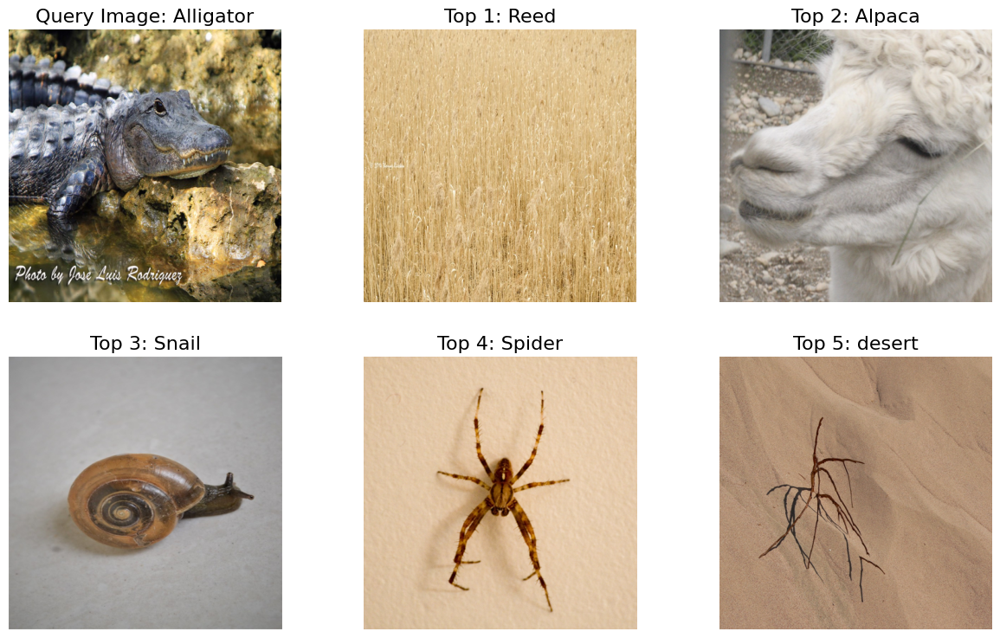

In [22]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Alligator/17250018551_eaf395294d_b.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

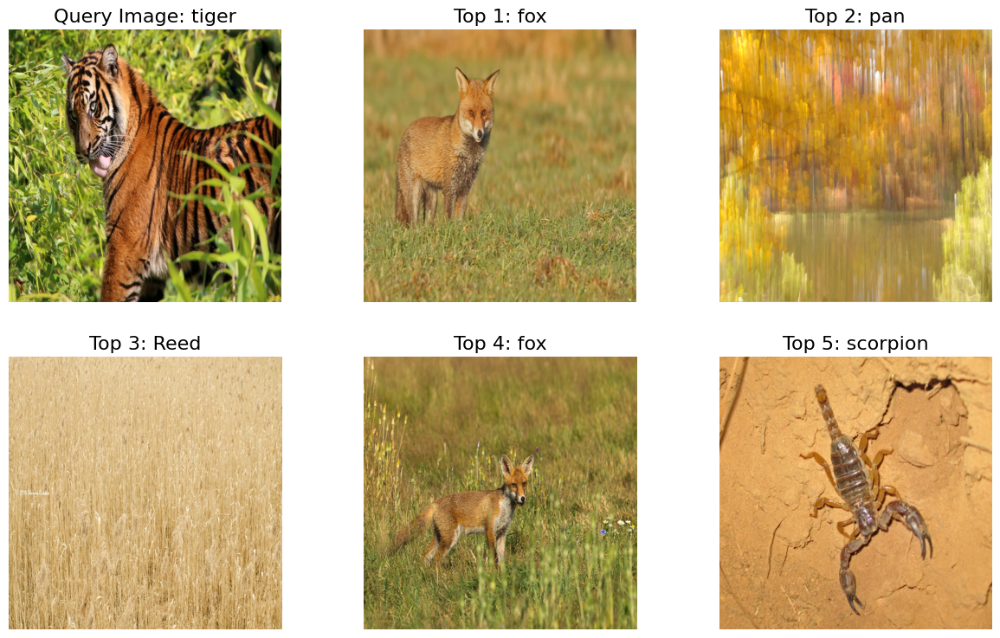

In [23]:
root_img_path =f"{ROOT}/train/"
query_path = f"{ROOT}/test/tiger/15912220596_0efe5578be_b.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [24]:
ls_path_score

[('data/train/Mushroom/4961199453_557599aa0b_b.jpg', 9.591456558951927),
 ('data/train/Mushroom/481012156_f8751644b8_b.jpg', 8.497723535837673),
 ('data/train/Mushroom/30773281961_a2983bf1be_b.jpg', 9.610667315860953),
 ('data/train/Mushroom/29359074785_d9567082ce_b.jpg', 7.11859830498215),
 ('data/train/Mushroom/3397647648_48b7c31722_b.jpg', 8.689224035314805),
 ('data/train/Mushroom/21545048500_e15da413a7_b.jpg', 8.34692945755462),
 ('data/train/Mushroom/189098954_f360f4bdfe_b.jpg', 7.749734190970755),
 ('data/train/Mushroom/3607099094_eed0cd0fed_b.jpg', 9.30565772109622),
 ('data/train/Mushroom/846207623_72126d2f02_b.jpg', 9.071135877728818),
 ('data/train/Mushroom/52954574_058d5c59b3_b.jpg', 8.857598169157306),
 ('data/train/Mushroom/6244561647_1eda34a95e_b.jpg', 8.231338527547521),
 ('data/train/Mushroom/897666596_34a809f30c_b.jpg', 9.392789818812048),
 ('data/train/Mushroom/5458607051_4daae473bf_b.jpg', 8.510124652950521),
 ('data/train/Mushroom/14882452851_009c72bfaf_b.jpg', 8.8

## Correlation Coefficient

In [25]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    query_mean = query - np.mean(query)
    data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)
    query_norm = np.sqrt(np.sum(query_mean**2))
    data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

    return np.sum(data_mean * query_mean, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)

In [26]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            rates = correlation_coefficient(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

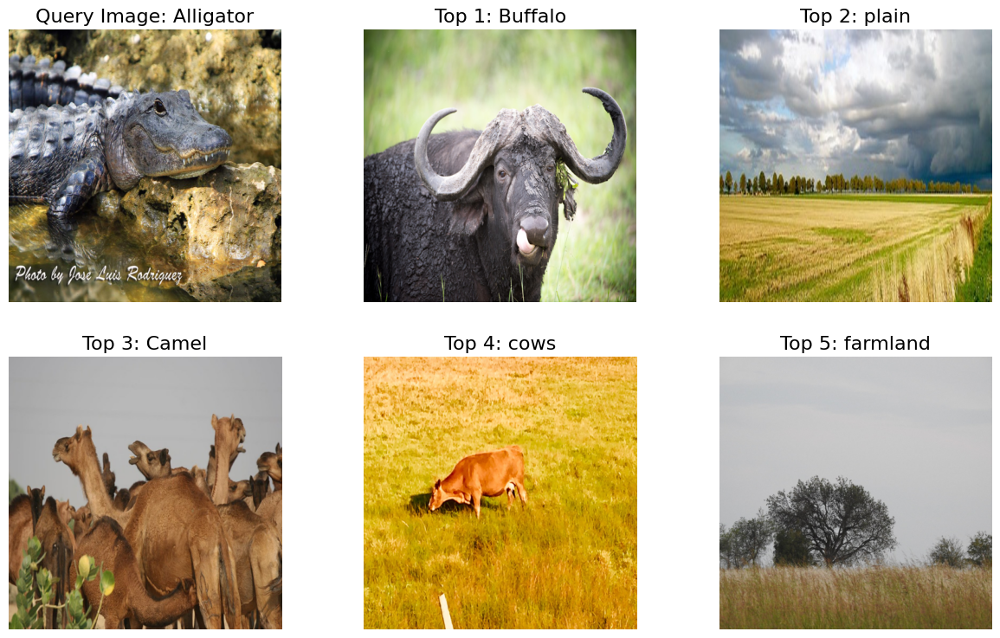

In [27]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Alligator/17250018551_eaf395294d_b.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

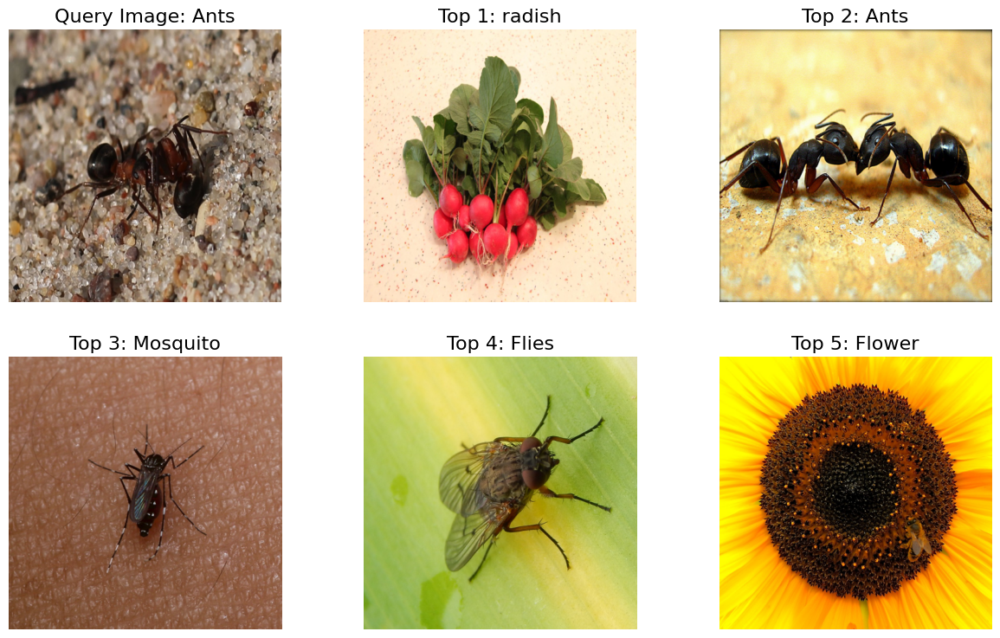

In [29]:
root_img_path =f"{ROOT}/train/"
query_path = f"{ROOT}/test/Ants/14058217107_01c59da497_b.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)